### Start execution

In [1]:
import time

In [2]:
start = time.time()

# 1. Setting the environment

In [3]:
!pip install -q resampy

# 2. Import Libraries

In [4]:
import os
import resampy
import librosa
import numpy as np
import pandas as pd
from PIL import Image
from IPython import display
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

In [5]:
from keras.models import Sequential
from keras.layers import Dense, Dropout, Activation, Flatten
from keras.layers import Convolution2D, Conv2D, MaxPooling2D, GlobalAveragePooling2D
from keras.optimizers import Adam
from sklearn import metrics

In [6]:
import warnings
warnings.filterwarnings("ignore")

# 3. Preparation

In [7]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [8]:
path_general = 'drive/MyDrive/Profesional_Academico/Github_Personal/ML_AI_Contents/09.Deep_Learning/73.Audio_NN_Scratch'

# 4. Metadata

In [9]:
df_metadata = pd.read_csv(f'{path_general}/processed/metadata.csv')

In [10]:
df_metadata['fold'] = df_metadata['file_name'].map(lambda x: x.split('/')[0])

In [11]:
df_metadata['file_name'] = df_metadata['file_name'].map(lambda x: x.split('/')[1])

In [12]:
df_metadata['file_name'] = df_metadata['file_name'].map(lambda x: x.split('.')[0])

# 5. Load model

In [13]:
num_rows = 40
num_columns = 174
num_channels = 1
num_labels = 10
filter_size = 2

# Construct model
model = Sequential()
model.add(Conv2D(filters=16, kernel_size=2, input_shape=(num_rows, num_columns, num_channels), activation='relu'))
model.add(MaxPooling2D(pool_size=2))
model.add(Dropout(0.2))

model.add(Conv2D(filters=32, kernel_size=2, activation='relu'))
model.add(MaxPooling2D(pool_size=2))
model.add(Dropout(0.2))

model.add(Conv2D(filters=64, kernel_size=2, activation='relu'))
model.add(MaxPooling2D(pool_size=2))
model.add(Dropout(0.2))

model.add(Conv2D(filters=128, kernel_size=2, activation='relu'))
model.add(MaxPooling2D(pool_size=2))
model.add(Dropout(0.2))
model.add(GlobalAveragePooling2D())

model.add(Dense(num_labels, activation='softmax'))

In [14]:
model.load_weights('drive/MyDrive/Profesional_Academico/Github_Personal/ML_AI_Contents/09.Deep_Learning/73.Audio_NN_Scratch/model/model.weights.h5')

# 6. Functions

In [15]:
dict_c = {}
dict_c['c'] = 0

In [16]:
def predict_class(file_name, fold):

  path_open = f'{path_general}/data/{fold}/{file_name}.wav'

  #------------------------------------------------------------------------------------------

  max_pad_len = 174

  audio, sample_rate = librosa.load(path_open, res_type = 'kaiser_fast')
  mfccs = librosa.feature.mfcc(y = audio, sr = sample_rate, n_mfcc = 40)
  pad_width = max_pad_len - mfccs.shape[1]
  mfccs = np.pad(mfccs, pad_width=((0, 0), (0, pad_width)), mode='constant')

  #------------------------------------------------------------------------------------------

  mfccs = mfccs.reshape(mfccs.shape[0], mfccs.shape[1], 1)

  #------------------------------------------------------------------------------------------

  mfccs = np.array([mfccs])

  #------------------------------------------------------------------------------------------

  predict_class = model.predict(mfccs)

  prediction = int(predict_class.argmax()) + 1

  #------------------------------------------------------------------------------------------

  dict_c['c'] = dict_c['c'] + 1

  print(dict_c['c'])

  #------------------------------------------------------------------------------------------

  return prediction

In [17]:
def predict_class_2(file_name, fold):

  path_open = f'{path_general}/data/{fold}/{file_name}.wav'

  #------------------------------------------------------------------------------------------

  max_pad_len = 174

  audio, sample_rate = librosa.load(path_open, res_type = 'kaiser_fast')
  mfccs = librosa.feature.mfcc(y = audio, sr = sample_rate, n_mfcc = 40)
  pad_width = max_pad_len - mfccs.shape[1]
  mfccs = np.pad(mfccs, pad_width=((0, 0), (0, pad_width)), mode='constant')

  #------------------------------------------------------------------------------------------

  mfccs = mfccs.reshape(mfccs.shape[0], mfccs.shape[1], 1)

  plt.figure(figsize = (17, 10))
  plt.imshow(mfccs)
  plt.show()

  #------------------------------------------------------------------------------------------

  mfccs = np.array([mfccs])

  #------------------------------------------------------------------------------------------

  predict_class = model.predict(mfccs)

  return predict_class

# 7. Inference

In [18]:
df_metadata['pred'] = df_metadata.apply(lambda x: predict_class(x['file_name'], x['fold']), axis = 1)

Se truncaron las últimas líneas 5000 del resultado de transmisión.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
6233
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
6234
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
6235
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
6236
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
6237
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
6238
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
6239
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
6240
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
6241
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
6242
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
6243
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
6244
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
6245
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
6246
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
6247
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
6248
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
6249
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
6250
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
6251
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
6252
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
6253
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28

In [19]:
dict_class = {
    1: 'street_music',
    2: 'drilling',
    3: 'children_playing',
    4: 'dog_bark',
    5: 'engine_idling',
    6: 'jackhammer',
    7: 'air_conditioner',
    8: 'siren',
    9: 'car_horn',
    10: 'gun_shot'
    }

In [20]:
df_metadata = df_metadata.replace({
    'id_class': dict_class,
    'pred': dict_class
})

# 8. Performance

In [21]:
df_train = df_metadata[df_metadata['subset'] == 'train'].copy()
df_val = df_metadata[df_metadata['subset'] == 'val'].copy()
df_test = df_metadata[df_metadata['subset'] == 'test'].copy()

### a. Train

In [22]:
round(((df_train['id_class'] == df_train['pred'])*1).mean()*100, 2)

99.85

### b. Val

In [23]:
round(((df_val['id_class'] == df_val['pred'])*1).mean()*100, 2)

93.47

### c. Test

In [24]:
round(((df_test['id_class'] == df_test['pred'])*1).mean()*100, 2)

92.79

In [25]:
cm = confusion_matrix(df_test['id_class'], df_test['pred'], labels = list(dict_class.values()))

In [26]:
disp = ConfusionMatrixDisplay(confusion_matrix = cm, display_labels = list(dict_class.values()))

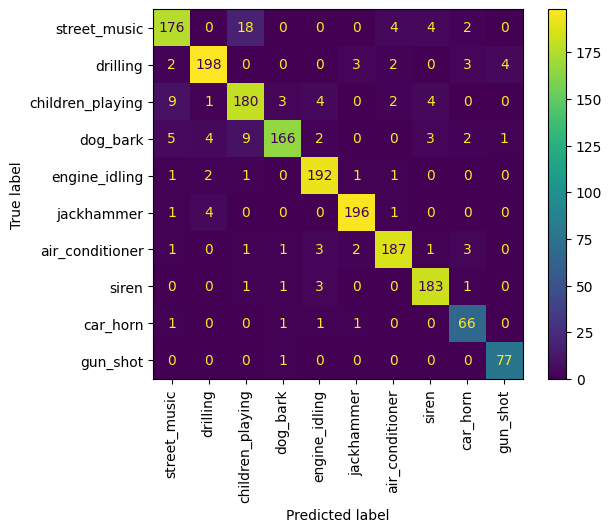

In [27]:
disp.plot()
plt.xticks(rotation = 90)
plt.show()

# 9. Examples

In [28]:
dict_class = {
    0: 'street_music',
    1: 'drilling',
    2: 'children_playing',
    3: 'dog_bark',
    4: 'engine_idling',
    5: 'jackhammer',
    6: 'air_conditioner',
    7: 'siren',
    8: 'car_horn',
    9: 'gun_shot'
    }

### a. Street music

In [94]:
index_class = 0

In [95]:
class_name = dict_class[index_class]

In [96]:
file_name = df_test[df_test['id_class'] == class_name]['file_name'].iloc[1]
fold = df_test[df_test['id_class'] == class_name]['fold'].iloc[1]
path_open = f'{path_general}/data/{fold}/{file_name}.wav'

In [97]:
display.Audio(path_open,rate = 16000)

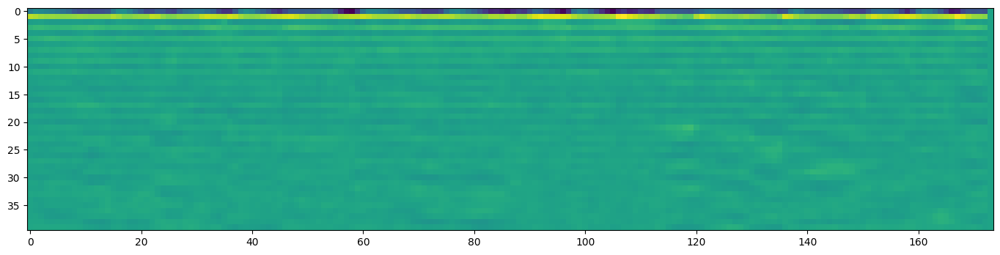

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


In [98]:
pred = predict_class_2(file_name, fold)

In [99]:
for k in range(len(dict_class.keys())):

  print('Name class:', dict_class[k])
  print('Prob:', round(pred[0][k]*100, 2))
  print('-'*70)

Name class: street_music
Prob: 99.97
----------------------------------------------------------------------
Name class: drilling
Prob: 0.0
----------------------------------------------------------------------
Name class: children_playing
Prob: 0.03
----------------------------------------------------------------------
Name class: dog_bark
Prob: 0.0
----------------------------------------------------------------------
Name class: engine_idling
Prob: 0.0
----------------------------------------------------------------------
Name class: jackhammer
Prob: 0.0
----------------------------------------------------------------------
Name class: air_conditioner
Prob: 0.0
----------------------------------------------------------------------
Name class: siren
Prob: 0.0
----------------------------------------------------------------------
Name class: car_horn
Prob: 0.0
----------------------------------------------------------------------
Name class: gun_shot
Prob: 0.0
-------------------------

### b. Drilling

In [35]:
index_class = 1

In [36]:
class_name = dict_class[index_class]

In [37]:
file_name = df_test[df_test['id_class'] == class_name]['file_name'].iloc[0]
fold = df_test[df_test['id_class'] == class_name]['fold'].iloc[0]
path_open = f'{path_general}/data/{fold}/{file_name}.wav'

In [38]:
display.Audio(path_open,rate = 16000)

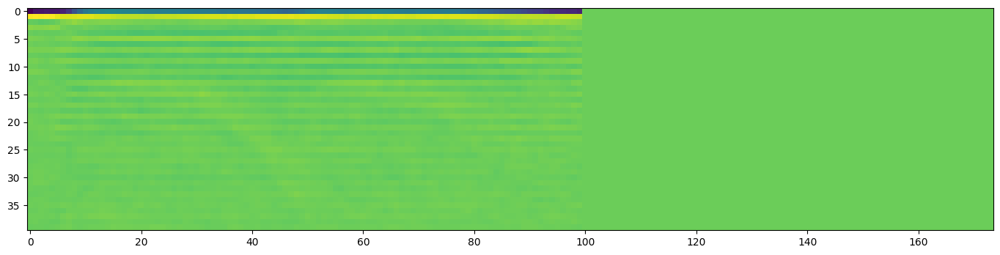

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


In [39]:
pred = predict_class_2(file_name, fold)

In [40]:
for k in range(len(dict_class.keys())):

  print('Name class:', dict_class[k])
  print('Prob:', round(pred[0][k]*100, 2))
  print('-'*70)

Name class: street_music
Prob: 0.0
----------------------------------------------------------------------
Name class: drilling
Prob: 98.86
----------------------------------------------------------------------
Name class: children_playing
Prob: 0.01
----------------------------------------------------------------------
Name class: dog_bark
Prob: 0.06
----------------------------------------------------------------------
Name class: engine_idling
Prob: 0.01
----------------------------------------------------------------------
Name class: jackhammer
Prob: 0.65
----------------------------------------------------------------------
Name class: air_conditioner
Prob: 0.13
----------------------------------------------------------------------
Name class: siren
Prob: 0.0
----------------------------------------------------------------------
Name class: car_horn
Prob: 0.28
----------------------------------------------------------------------
Name class: gun_shot
Prob: 0.0
--------------------

### c. Children Playing

In [100]:
index_class = 2

In [101]:
class_name = dict_class[index_class]

In [102]:
file_name = df_test[df_test['id_class'] == class_name]['file_name'].iloc[1]
fold = df_test[df_test['id_class'] == class_name]['fold'].iloc[1]
path_open = f'{path_general}/data/{fold}/{file_name}.wav'

In [103]:
display.Audio(path_open,rate = 16000)

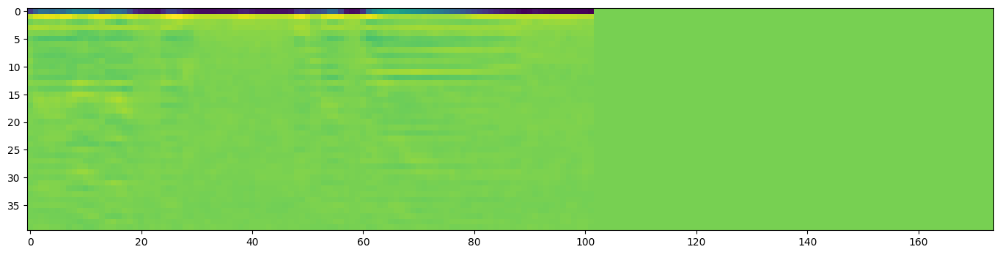

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


In [104]:
pred = predict_class_2(file_name, fold)

In [105]:
for k in range(len(dict_class.keys())):

  print('Name class:', dict_class[k])
  print('Prob:', round(pred[0][k]*100, 2))
  print('-'*70)

Name class: street_music
Prob: 0.0
----------------------------------------------------------------------
Name class: drilling
Prob: 0.0
----------------------------------------------------------------------
Name class: children_playing
Prob: 100.0
----------------------------------------------------------------------
Name class: dog_bark
Prob: 0.0
----------------------------------------------------------------------
Name class: engine_idling
Prob: 0.0
----------------------------------------------------------------------
Name class: jackhammer
Prob: 0.0
----------------------------------------------------------------------
Name class: air_conditioner
Prob: 0.0
----------------------------------------------------------------------
Name class: siren
Prob: 0.0
----------------------------------------------------------------------
Name class: car_horn
Prob: 0.0
----------------------------------------------------------------------
Name class: gun_shot
Prob: 0.0
--------------------------

### d. Dog Bark

In [47]:
index_class = 3

In [48]:
class_name = dict_class[index_class]

In [49]:
file_name = df_test[df_test['id_class'] == class_name]['file_name'].iloc[0]
fold = df_test[df_test['id_class'] == class_name]['fold'].iloc[0]
path_open = f'{path_general}/data/{fold}/{file_name}.wav'

In [50]:
display.Audio(path_open,rate = 16000)

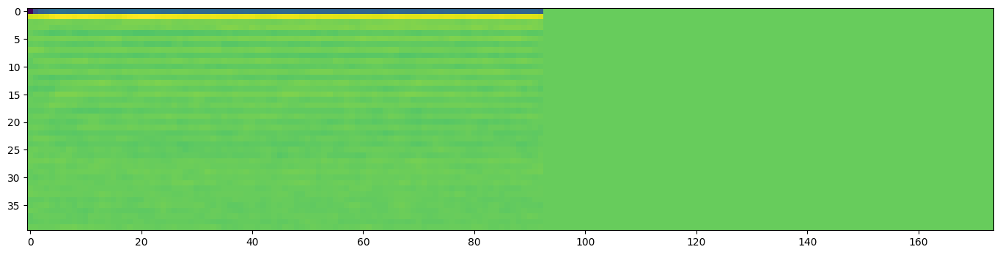

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


In [51]:
pred = predict_class_2(file_name, fold)

In [52]:
for k in range(len(dict_class.keys())):

  print('Name class:', dict_class[k])
  print('Prob:', round(pred[0][k]*100, 2))
  print('-'*70)

Name class: street_music
Prob: 0.1
----------------------------------------------------------------------
Name class: drilling
Prob: 0.01
----------------------------------------------------------------------
Name class: children_playing
Prob: 0.0
----------------------------------------------------------------------
Name class: dog_bark
Prob: 80.77
----------------------------------------------------------------------
Name class: engine_idling
Prob: 19.11
----------------------------------------------------------------------
Name class: jackhammer
Prob: 0.01
----------------------------------------------------------------------
Name class: air_conditioner
Prob: 0.0
----------------------------------------------------------------------
Name class: siren
Prob: 0.0
----------------------------------------------------------------------
Name class: car_horn
Prob: 0.0
----------------------------------------------------------------------
Name class: gun_shot
Prob: 0.0
----------------------

### e. Engine Idling

In [53]:
index_class = 4

In [54]:
class_name = dict_class[index_class]

In [55]:
file_name = df_test[df_test['id_class'] == class_name]['file_name'].iloc[0]
fold = df_test[df_test['id_class'] == class_name]['fold'].iloc[0]
path_open = f'{path_general}/data/{fold}/{file_name}.wav'

In [56]:
display.Audio(path_open,rate = 16000)

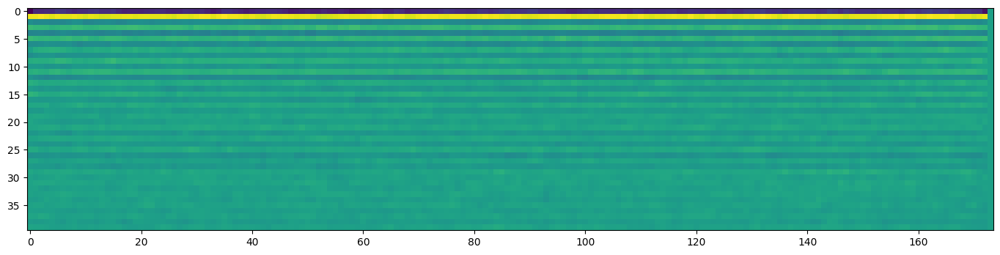

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


In [57]:
pred = predict_class_2(file_name, fold)

In [58]:
for k in range(len(dict_class.keys())):

  print('Name class:', dict_class[k])
  print('Prob:', round(pred[0][k]*100, 2))
  print('-'*70)

Name class: street_music
Prob: 0.0
----------------------------------------------------------------------
Name class: drilling
Prob: 0.0
----------------------------------------------------------------------
Name class: children_playing
Prob: 0.0
----------------------------------------------------------------------
Name class: dog_bark
Prob: 0.0
----------------------------------------------------------------------
Name class: engine_idling
Prob: 100.0
----------------------------------------------------------------------
Name class: jackhammer
Prob: 0.0
----------------------------------------------------------------------
Name class: air_conditioner
Prob: 0.0
----------------------------------------------------------------------
Name class: siren
Prob: 0.0
----------------------------------------------------------------------
Name class: car_horn
Prob: 0.0
----------------------------------------------------------------------
Name class: gun_shot
Prob: 0.0
--------------------------

### f. Jackhammer

In [59]:
index_class = 5

In [60]:
class_name = dict_class[index_class]

In [61]:
file_name = df_test[df_test['id_class'] == class_name]['file_name'].iloc[0]
fold = df_test[df_test['id_class'] == class_name]['fold'].iloc[0]
path_open = f'{path_general}/data/{fold}/{file_name}.wav'

In [62]:
display.Audio(path_open,rate = 16000)

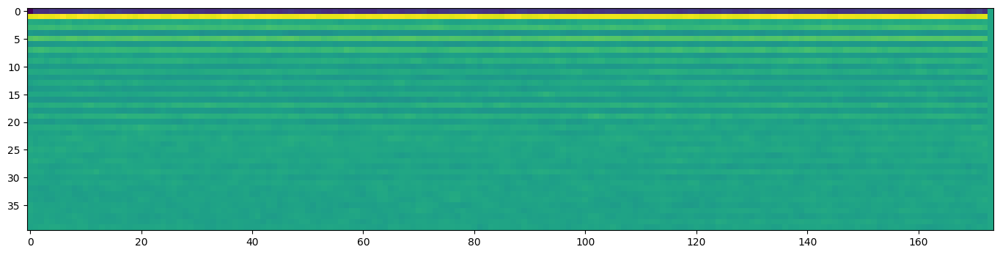

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


In [63]:
pred = predict_class_2(file_name, fold)

In [64]:
for k in range(len(dict_class.keys())):

  print('Name class:', dict_class[k])
  print('Prob:', round(pred[0][k]*100, 2))
  print('-'*70)

Name class: street_music
Prob: 0.0
----------------------------------------------------------------------
Name class: drilling
Prob: 0.03
----------------------------------------------------------------------
Name class: children_playing
Prob: 0.0
----------------------------------------------------------------------
Name class: dog_bark
Prob: 0.0
----------------------------------------------------------------------
Name class: engine_idling
Prob: 0.0
----------------------------------------------------------------------
Name class: jackhammer
Prob: 99.97
----------------------------------------------------------------------
Name class: air_conditioner
Prob: 0.0
----------------------------------------------------------------------
Name class: siren
Prob: 0.0
----------------------------------------------------------------------
Name class: car_horn
Prob: 0.0
----------------------------------------------------------------------
Name class: gun_shot
Prob: 0.0
-------------------------

### g. Air Conditioner

In [65]:
index_class = 6

In [66]:
class_name = dict_class[index_class]

In [67]:
file_name = df_test[df_test['id_class'] == class_name]['file_name'].iloc[0]
fold = df_test[df_test['id_class'] == class_name]['fold'].iloc[0]
path_open = f'{path_general}/data/{fold}/{file_name}.wav'

In [68]:
display.Audio(path_open,rate = 16000)

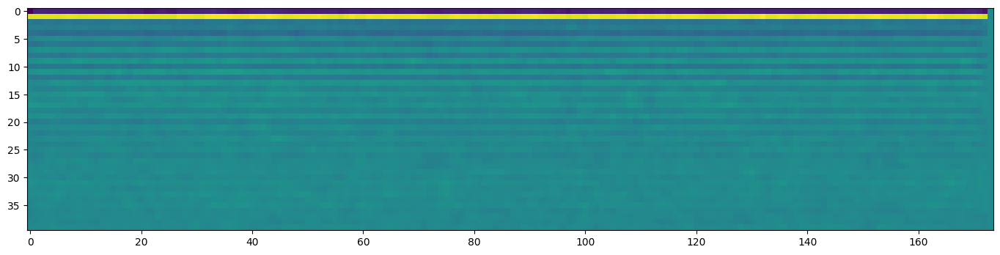

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


In [69]:
pred = predict_class_2(file_name, fold)

In [70]:
for k in range(len(dict_class.keys())):

  print('Name class:', dict_class[k])
  print('Prob:', round(pred[0][k]*100, 2))
  print('-'*70)

Name class: street_music
Prob: 0.0
----------------------------------------------------------------------
Name class: drilling
Prob: 0.0
----------------------------------------------------------------------
Name class: children_playing
Prob: 0.0
----------------------------------------------------------------------
Name class: dog_bark
Prob: 0.0
----------------------------------------------------------------------
Name class: engine_idling
Prob: 0.0
----------------------------------------------------------------------
Name class: jackhammer
Prob: 0.0
----------------------------------------------------------------------
Name class: air_conditioner
Prob: 100.0
----------------------------------------------------------------------
Name class: siren
Prob: 0.0
----------------------------------------------------------------------
Name class: car_horn
Prob: 0.0
----------------------------------------------------------------------
Name class: gun_shot
Prob: 0.0
--------------------------

### h. Siren

In [71]:
index_class = 7

In [72]:
class_name = dict_class[index_class]

In [73]:
file_name = df_test[df_test['id_class'] == class_name]['file_name'].iloc[0]
fold = df_test[df_test['id_class'] == class_name]['fold'].iloc[0]
path_open = f'{path_general}/data/{fold}/{file_name}.wav'

In [74]:
display.Audio(path_open,rate = 16000)

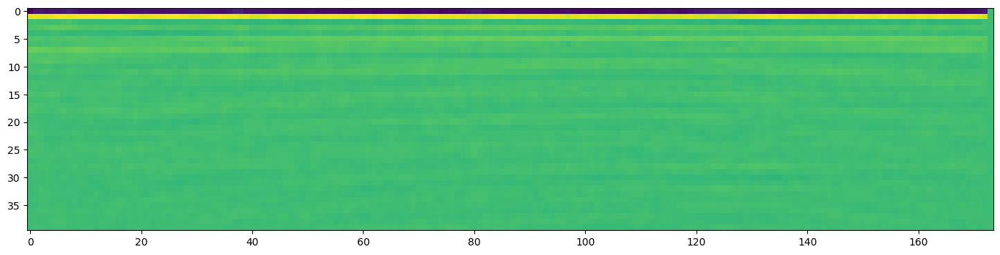

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


In [75]:
pred = predict_class_2(file_name, fold)

In [76]:
for k in range(len(dict_class.keys())):

  print('Name class:', dict_class[k])
  print('Prob:', round(pred[0][k]*100, 2))
  print('-'*70)

Name class: street_music
Prob: 0.04
----------------------------------------------------------------------
Name class: drilling
Prob: 0.0
----------------------------------------------------------------------
Name class: children_playing
Prob: 0.01
----------------------------------------------------------------------
Name class: dog_bark
Prob: 0.0
----------------------------------------------------------------------
Name class: engine_idling
Prob: 17.75
----------------------------------------------------------------------
Name class: jackhammer
Prob: 0.0
----------------------------------------------------------------------
Name class: air_conditioner
Prob: 0.0
----------------------------------------------------------------------
Name class: siren
Prob: 82.2
----------------------------------------------------------------------
Name class: car_horn
Prob: 0.0
----------------------------------------------------------------------
Name class: gun_shot
Prob: 0.0
-----------------------

### i. Car Horn

In [77]:
index_class = 8

In [78]:
class_name = dict_class[index_class]

In [79]:
file_name = df_test[df_test['id_class'] == class_name]['file_name'].iloc[0]
fold = df_test[df_test['id_class'] == class_name]['fold'].iloc[0]
path_open = f'{path_general}/data/{fold}/{file_name}.wav'

In [80]:
display.Audio(path_open,rate = 16000)

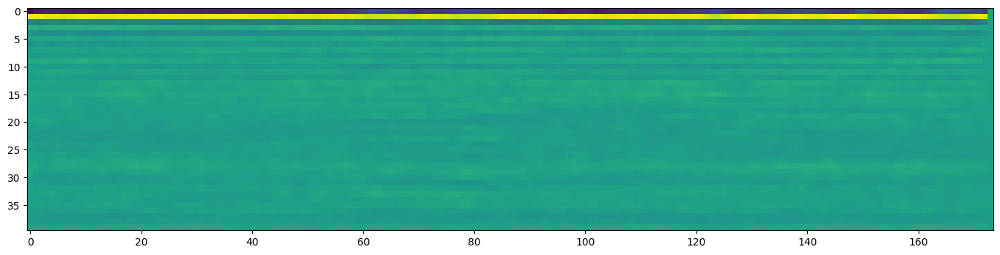

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


In [81]:
pred = predict_class_2(file_name, fold)

In [82]:
for k in range(len(dict_class.keys())):

  print('Name class:', dict_class[k])
  print('Prob:', round(pred[0][k]*100, 2))
  print('-'*70)

Name class: street_music
Prob: 0.0
----------------------------------------------------------------------
Name class: drilling
Prob: 0.0
----------------------------------------------------------------------
Name class: children_playing
Prob: 0.0
----------------------------------------------------------------------
Name class: dog_bark
Prob: 0.0
----------------------------------------------------------------------
Name class: engine_idling
Prob: 0.0
----------------------------------------------------------------------
Name class: jackhammer
Prob: 0.0
----------------------------------------------------------------------
Name class: air_conditioner
Prob: 0.0
----------------------------------------------------------------------
Name class: siren
Prob: 0.0
----------------------------------------------------------------------
Name class: car_horn
Prob: 100.0
----------------------------------------------------------------------
Name class: gun_shot
Prob: 0.0
--------------------------

### j. Gunshot

In [83]:
index_class = 9

In [84]:
class_name = dict_class[index_class]

In [85]:
file_name = df_test[df_test['id_class'] == class_name]['file_name'].iloc[0]
fold = df_test[df_test['id_class'] == class_name]['fold'].iloc[0]
path_open = f'{path_general}/data/{fold}/{file_name}.wav'

In [86]:
display.Audio(path_open,rate = 16000)

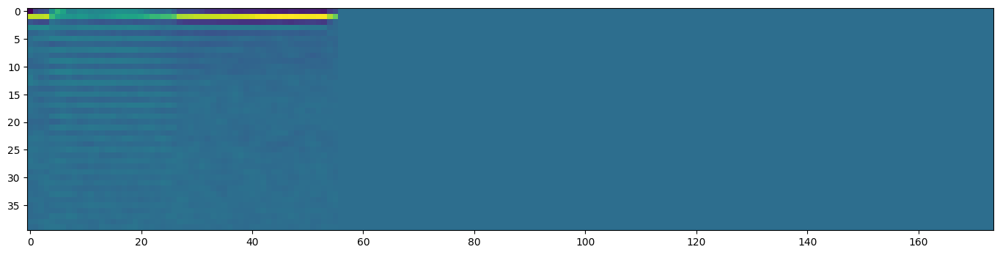

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


In [87]:
pred = predict_class_2(file_name, fold)

In [88]:
for k in range(len(dict_class.keys())):

  print('Name class:', dict_class[k])
  print('Prob:', round(pred[0][k]*100, 2))
  print('-'*70)

Name class: street_music
Prob: 0.0
----------------------------------------------------------------------
Name class: drilling
Prob: 0.0
----------------------------------------------------------------------
Name class: children_playing
Prob: 0.0
----------------------------------------------------------------------
Name class: dog_bark
Prob: 0.0
----------------------------------------------------------------------
Name class: engine_idling
Prob: 0.0
----------------------------------------------------------------------
Name class: jackhammer
Prob: 0.0
----------------------------------------------------------------------
Name class: air_conditioner
Prob: 0.0
----------------------------------------------------------------------
Name class: siren
Prob: 0.0
----------------------------------------------------------------------
Name class: car_horn
Prob: 0.0
----------------------------------------------------------------------
Name class: gun_shot
Prob: 100.0
--------------------------

### End of execution

In [89]:
end = time.time()

delta = (end - start)

hours = int(delta/3_600)
mins = int((delta - hours*3_600)/60)
secs = int(delta - hours*3_600 - mins*60)

print(f'Hours: {hours}, Minutes: {mins}, Seconds: {secs}')

Hours: 2, Minutes: 10, Seconds: 21
